In [1]:
import requests
from tabulate import tabulate
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter

# Initialize table_data
table_data = []

# Gutendex API parameters and setup
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_response = response.json()
    gutendex_books = gutendex_response.get('results', [])
    
    # Loop through a limited number of books to keep it manageable
    for book in gutendex_books:  # Adjust the slice as needed
        title = book.get('title', 'Unknown Title')
        authors = book.get('authors', [])
        author = authors[0].get('name') if authors else 'Unknown Author'
        
        # Get text file URL
        text_url = book.get('formats', {}).get('text/plain', '')
        
        # Download text and count words only if a text file is available
        if text_url:
            text_response = requests.get(text_url)
            if text_response.status_code == 200:
                text = text_response.text
                word_count = len(text.split())
                
                # Append data to the table
                table_data.append([title, author, word_count])
            else:
                continue  # Skip if download failed
        else:
            continue  # Skip if no text file

    # Print the table if there is any data
    if table_data:
        headers = ["Title", "Author", "Word Count"]
        table = tabulate(table_data, headers=headers, tablefmt="pretty")
        print(table)
    else:
        print("No books with text files found.")

else:
    print(f"Failed to retrieve data: {response.status_code}")


+-----------------------------------------------+--------------------------------------+------------+
|                     Title                     |                Author                | Word Count |
+-----------------------------------------------+--------------------------------------+------------+
|                  2 B R 0 2 B                  |            Vonnegut, Kurt            |    5646    |
|                The green girl                 |           Williamson, Jack           |   43060    |
|            The Big Trip Up Yonder             |            Vonnegut, Kurt            |    6720    |
|                   Watchbird                   |           Sheckley, Robert           |   10121    |
|                Search the Sky                 |            Pohl, Frederik            |   56396    |
|               The Time Traders                |            Norton, Andre             |   67379    |
|          The Tunnel Under the World           |            Pohl, Frederik       

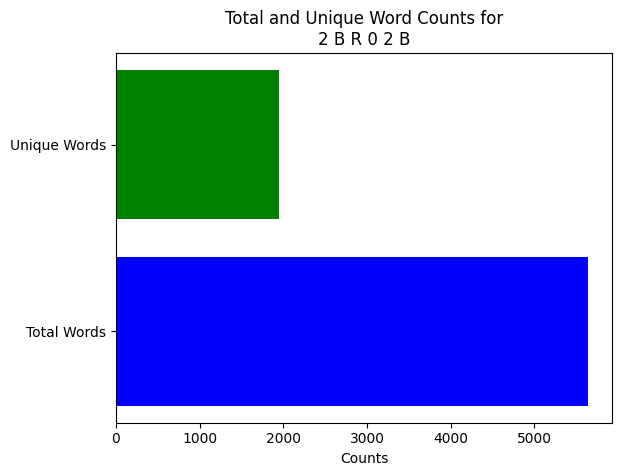

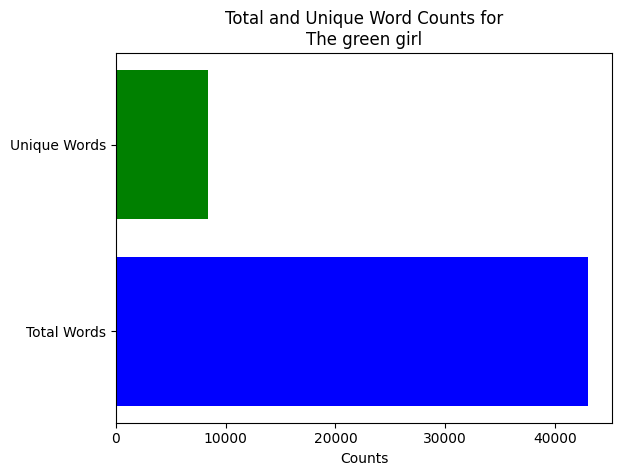

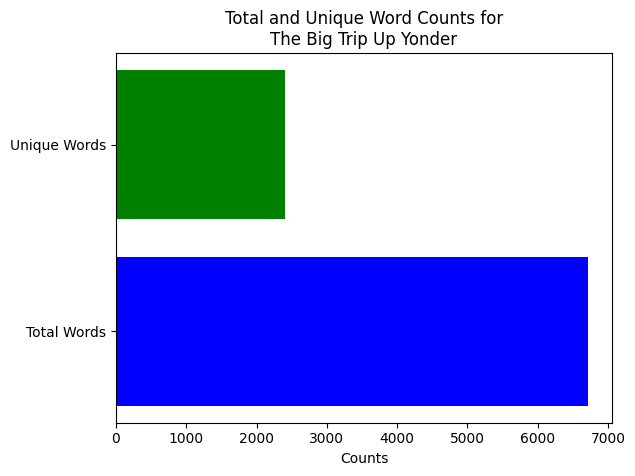

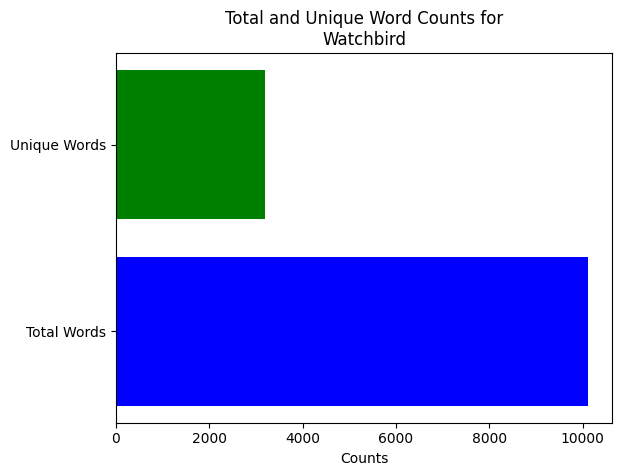

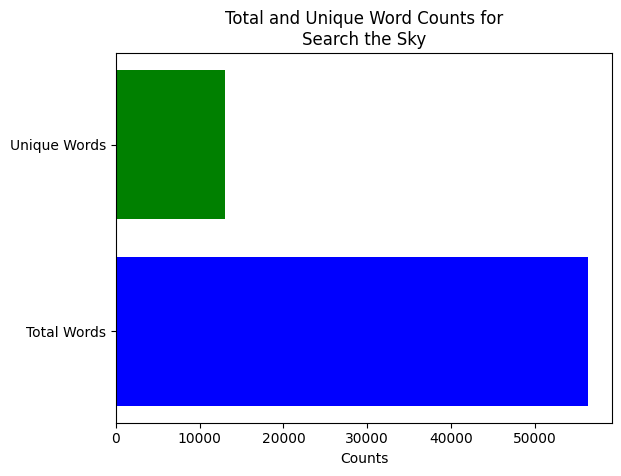

...

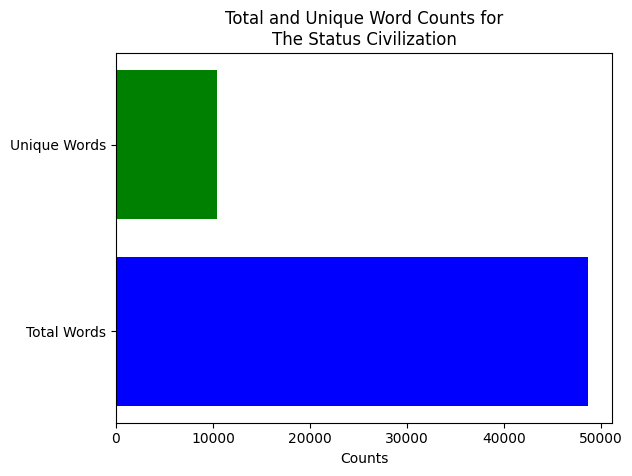

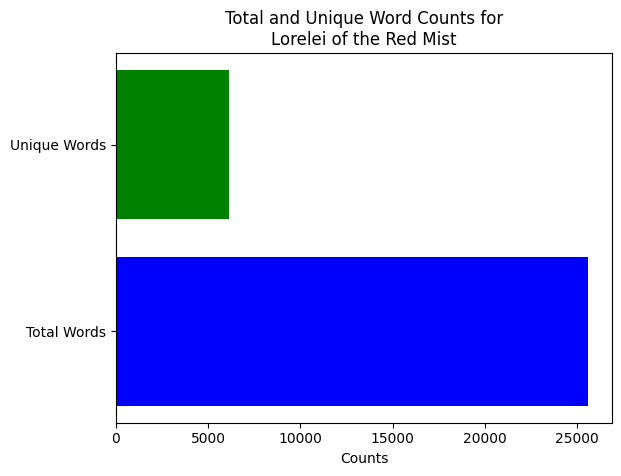

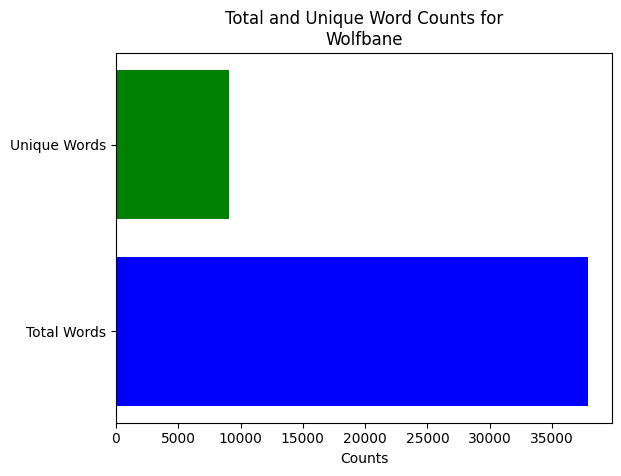

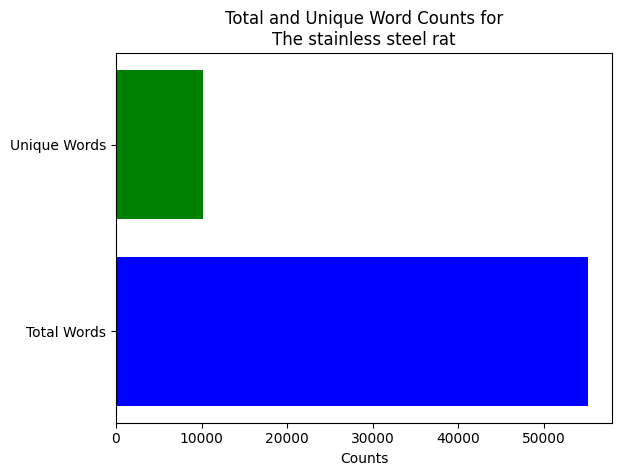

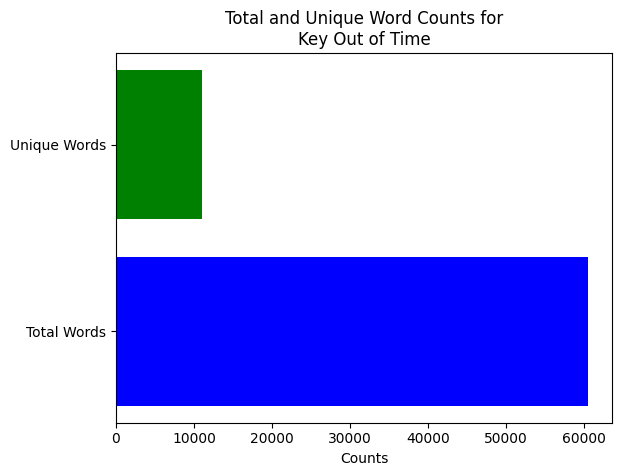

In [2]:
import requests
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter
import matplotlib.pyplot as plt

# Gutendex API parameters and setup
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_response = response.json()
    gutendex_books = gutendex_response.get('results', [])
    
    # Loop through a limited number of books to keep it manageable
    for book in gutendex_books:
        title = book.get('title', 'Unknown Title')
        authors = book.get('authors', [])
        author = authors[0].get('name') if authors else 'Unknown Author'
        
        # Get text file URL
        text_url = book.get('formats', {}).get('text/plain', '')
        
        # Download text and count words only if a text file is available
        if text_url:
            text_response = requests.get(text_url)
            if text_response.status_code == 200:
                text = text_response.text
                word_count = len(text.split())
                unique_word_count = len(set(text.split()))
                
                # Create a horizontal bar chart for this book
                y = ['Total Words', 'Unique Words']
                x = [word_count, unique_word_count]
                plt.barh(y, x, color=['blue', 'green'])
                
                plt.xlabel('Counts')
                plt.title(f'Total and Unique Word Counts for\n{title}')
                plt.show()
                
else:
    print(f"Failed to retrieve data: {response.status_code}")

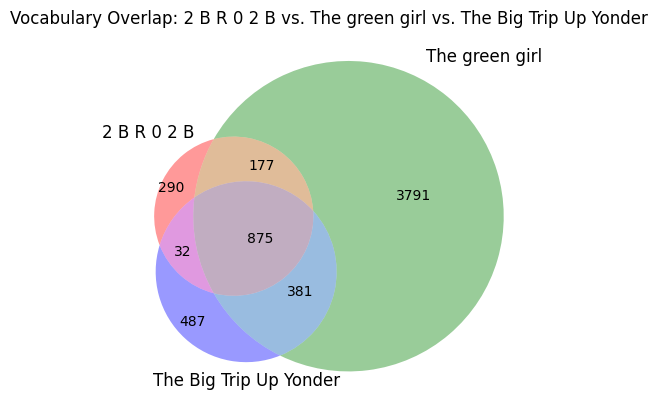

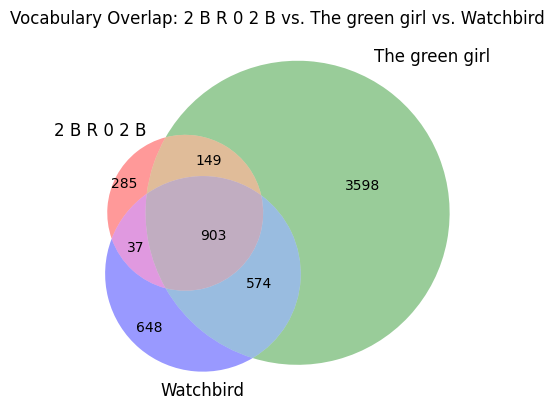

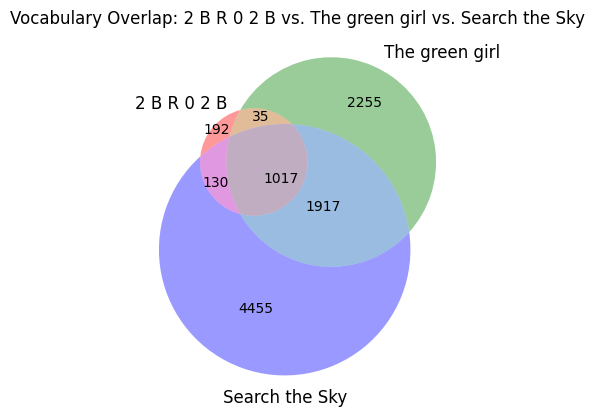

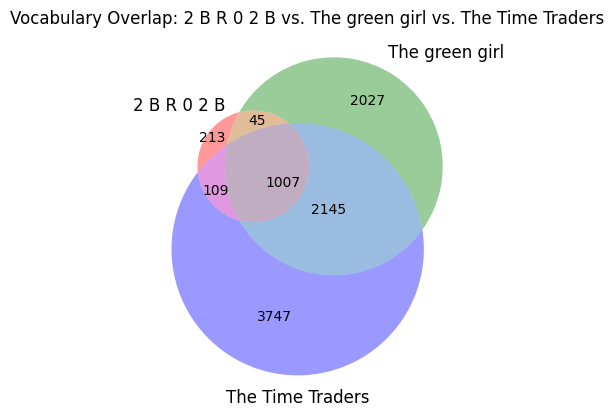

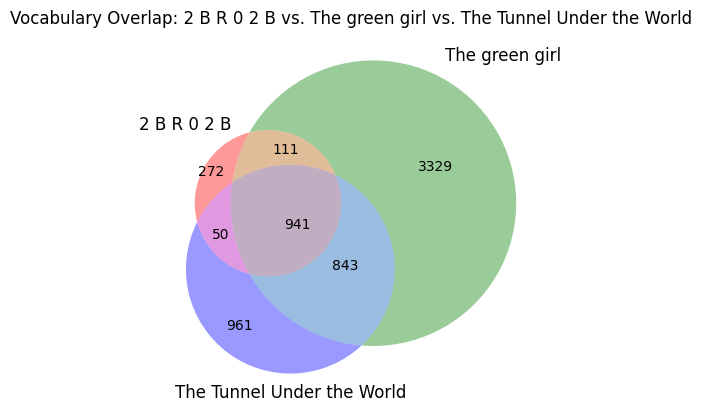

...

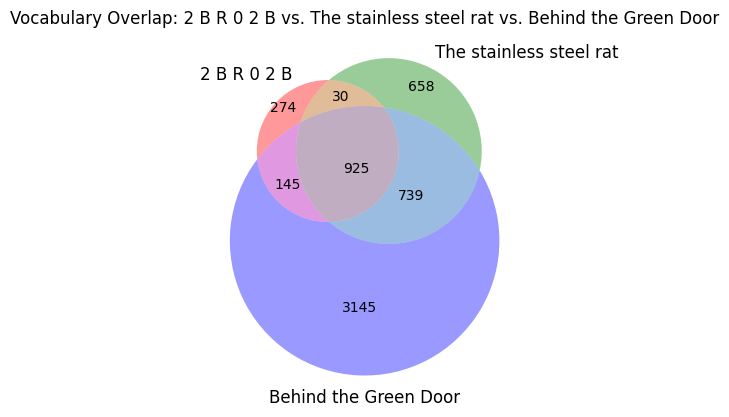

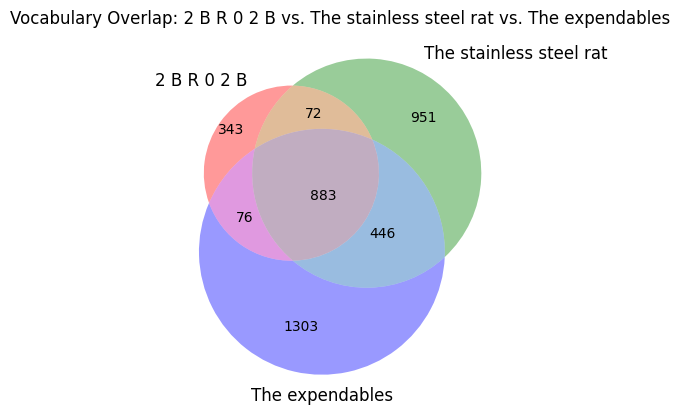

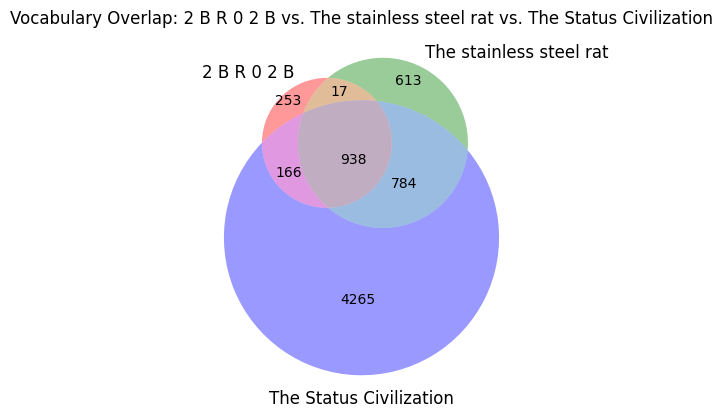

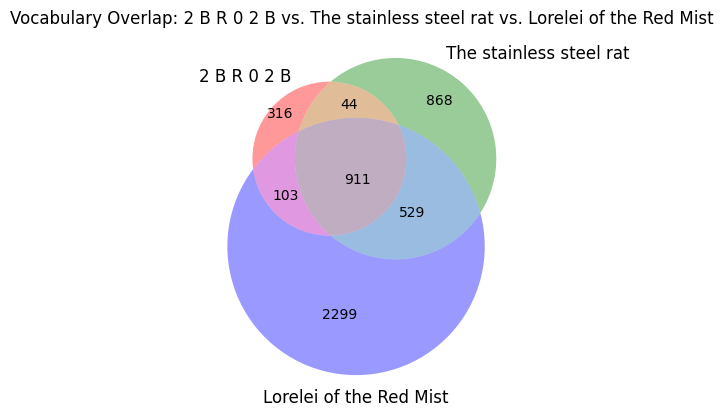

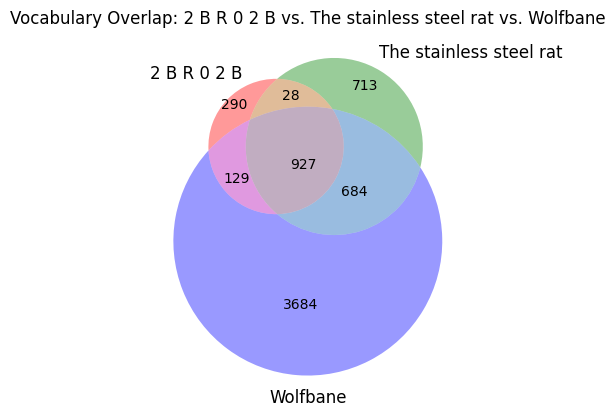

TypeError: bad operand type for abs(): 'dict_values'

In [3]:
import requests
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter
from itertools import combinations
from matplotlib_venn import venn3
import matplotlib.pyplot as plt
import re

# Function to tokenize words in a text
def tokenize_words(text):
    text = text.lower()
    words = re.findall(r'\b\w+\b', text)  # Tokenize words using regex
    return set(words)

# Gutendex API parameters and setup
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_response = response.json()
    gutendex_books = gutendex_response.get('results', [])  # Limit to first 3 books for the example
    
    book_info = []
    
    for book in gutendex_books:
        title = book.get('title', 'Unknown Title')
        text_url = book.get('formats', {}).get('text/plain', '')
        
        if text_url:
            text_response = requests.get(text_url)
            if text_response.status_code == 200:
                text = text_response.text
                words_set = tokenize_words(text)
                book_info.append({'title': title, 'words_set': words_set})

    # Create Venn diagrams for all possible combinations of 3 books (if available)
    combinations_3 = list(combinations(book_info, 3))
    for combo in combinations_3:
        word_sets = {}
        for book in combo:
            title = book['title']
            word_sets[title] = book['words_set']

        venn3(subsets=word_sets.values(), set_labels=word_sets.keys())
        plt.title('Vocabulary Overlap: ' + ' vs. '.join(word_sets.keys()))
        plt.show()
else:
    print(f"Failed to retrieve data: {response.status_code}")

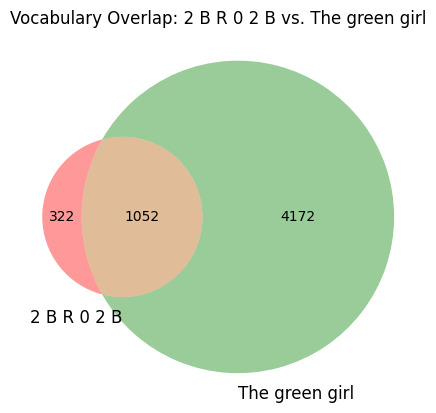

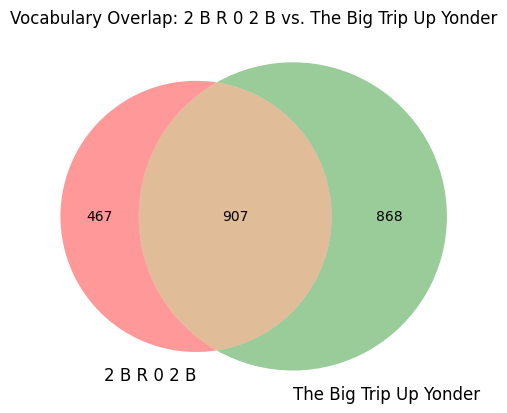

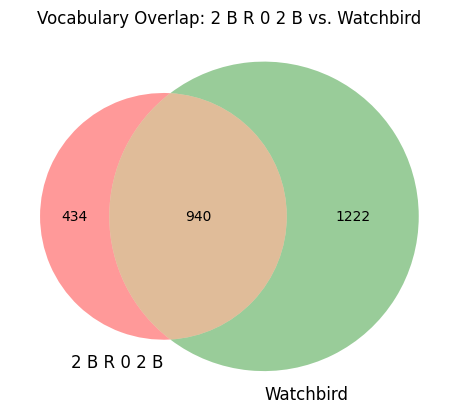

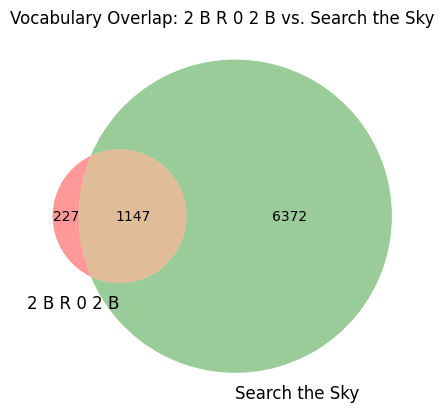

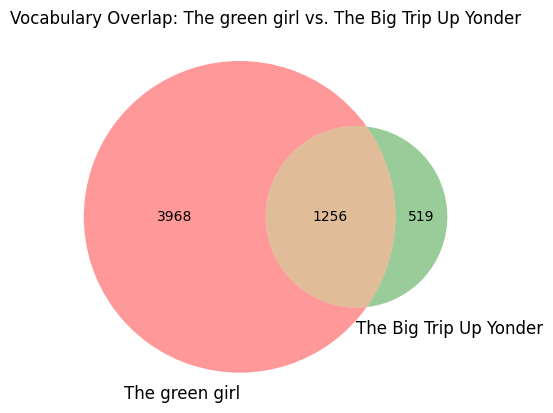

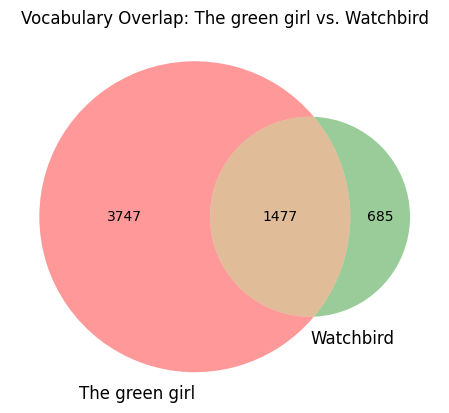

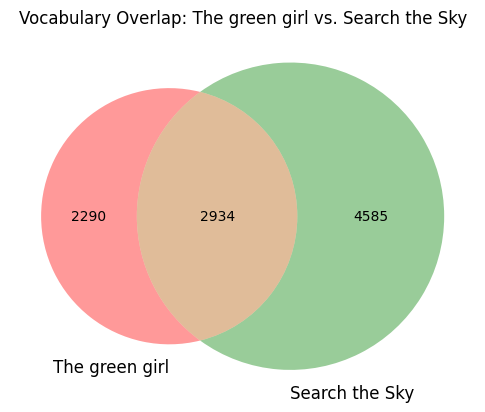

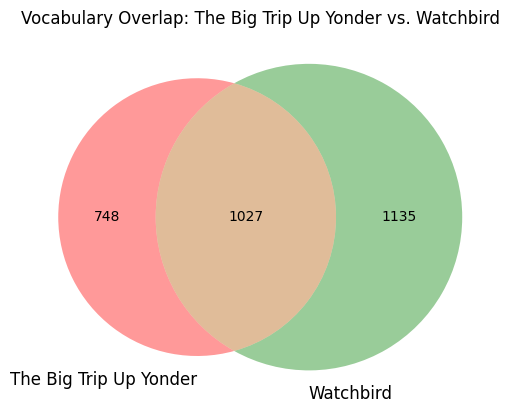

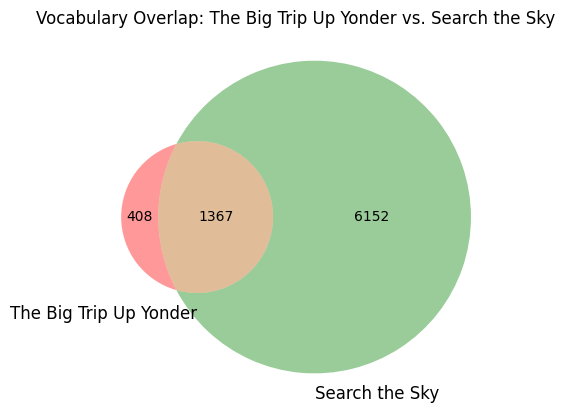

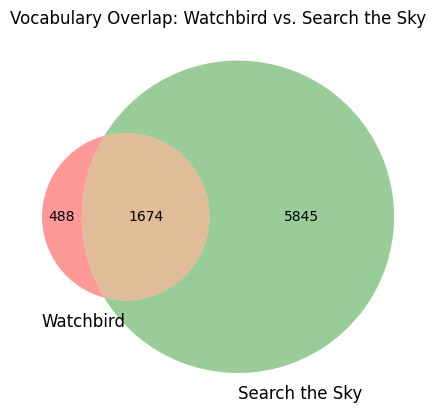

In [4]:
import requests
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter
from itertools import combinations
from matplotlib_venn import venn2
import matplotlib.pyplot as plt
import re

# Function to tokenize words in a text
def tokenize_words(text):
    text = text.lower()
    words = re.findall(r'\b\w+\b', text)  # Tokenize words using regex
    return set(words)

# Gutendex API parameters and setup
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_response = response.json()
    gutendex_books = gutendex_response.get('results', [])[:5]  # Limit to first 5 books for the example
    
    book_info = []
    
    for book in gutendex_books:
        title = book.get('title', 'Unknown Title')
        text_url = book.get('formats', {}).get('text/plain', '')
        
        if text_url:
            text_response = requests.get(text_url)
            if text_response.status_code == 200:
                text = text_response.text
                words_set = tokenize_words(text)
                book_info.append({'title': title, 'words_set': words_set})

    # Create Venn diagrams for all possible combinations of 2 books (if available)
    combinations_2 = list(combinations(book_info, 2))
    
    for combo in combinations_2:
        word_sets = {}
        for book in combo:
            title = book['title']
            word_sets[title] = book['words_set']

        venn2(subsets=word_sets.values(), set_labels=word_sets.keys())
        plt.title('Vocabulary Overlap: ' + ' vs. '.join(word_sets.keys()))
        plt.show()
else:
    print(f"Failed to retrieve data: {response.status_code}")

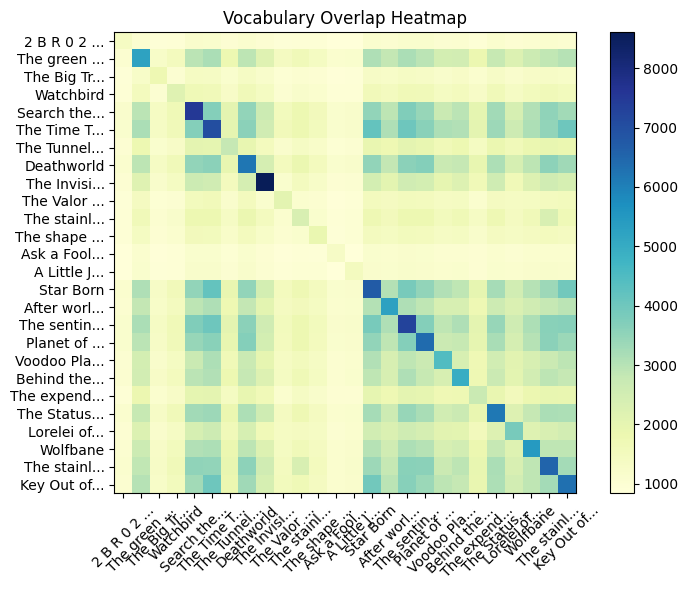

In [8]:
import requests
import numpy as np
import matplotlib.pyplot as plt
import re
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter

# Function to tokenize words in a text
def tokenize_words(text):
    text = text.lower()
    words = re.findall(r'\b\w+\b', text)  # Tokenize words using regex
    return set(words)

# Function to shorten titles
def shorten_title(title, max_length=10):
    if len(title) > max_length:
        return title[:max_length] + "..."
    else:
        return title

# Gutendex API parameters and setup
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_response = response.json()
    gutendex_books = gutendex_response.get('results', [])

    book_info = []

    for book in gutendex_books:
        title = book.get('title', 'Unknown Title')
        text_url = book.get('formats', {}).get('text/plain', '')

        if text_url:
            text_response = requests.get(text_url)
            if text_response.status_code == 200:
                text = text_response.text
                words_set = tokenize_words(text)
                book_info.append({'title': title, 'words_set': words_set})

    # Create a matrix indicating vocabulary overlap
    overlap_matrix = np.zeros((len(book_info), len(book_info)), dtype=int)

    for i, book1 in enumerate(book_info):
        for j, book2 in enumerate(book_info):
            common_words = len(book1['words_set'].intersection(book2['words_set']))
            overlap_matrix[i, j] = common_words

    # Create a heatmap
    plt.figure(figsize=(8, 6))
    plt.imshow(overlap_matrix, cmap='YlGnBu', interpolation='nearest')

    plt.title('Vocabulary Overlap Heatmap')
    plt.colorbar()
    shortened_titles = [shorten_title(book['title']) for book in book_info]
    plt.xticks(np.arange(len(book_info)), shortened_titles, rotation=45)
    plt.yticks(np.arange(len(book_info)), shortened_titles)
    plt.tight_layout()
    plt.show()

else:
    print(f"Failed to retrieve data: {response.status_code}")

In [9]:
import requests
import nltk
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag
from nltk.probability import FreqDist
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter

# Download NLTK data if not already downloaded
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Initialize empty lists to store words
adverbs = []
adjectives = []
nouns = []
verbs = []

# Gutendex API parameters and setup
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_response = response.json()
    gutendex_books = gutendex_response.get('results', [])  # Limit to first 4 books for the example

    for book in gutendex_books:
        title = book.get('title', 'Unknown Title')
        text_url = book.get('formats', {}).get('text/plain', '')

        if text_url:
            text_response = requests.get(text_url)
            if text_response.status_code == 200:
                text = text_response.text

                # Tokenize words and perform part-of-speech tagging
                tokens = word_tokenize(text)
                tagged_words = pos_tag(tokens)
                
                # Categorize words based on parts of speech
                for word, pos in tagged_words:
                    if pos.startswith('RB'):  # Adverb
                        adverbs.append(word.lower())
                    elif pos.startswith('JJ'):  # Adjective
                        adjectives.append(word.lower())
                    elif pos.startswith('NN'):  # Noun
                        nouns.append(word.lower())
                    elif pos.startswith('VB'):  # Verb
                        verbs.append(word.lower())

                # Calculate the most common words for each category
                def most_common_words(word_list, num_words=10):
                    fdist = FreqDist(word_list)
                    return ", ".join([word for word, freq in fdist.most_common(num_words)])

                # Print the results for each book
                adverbs_list = most_common_words(adverbs)
                adjectives_list = most_common_words(adjectives)
                nouns_list = most_common_words(nouns)
                verbs_list = most_common_words(verbs)
                
                print("Book Title:", title)
                print("Common Adverbs:", adverbs_list)
                print("Common Adjectives:", adjectives_list)
                print("Common Nouns:", nouns_list)
                print("Common Verbs:", verbs_list)
                print("="*80)

else:
    print(f"Failed to retrieve data: {response.status_code}")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


Book Title: 2 B R 0 2 B
Common Adverbs: not, n't, then, so, very, here, even, just, still, only
Common Adjectives: electronic, other, old, orderly, full, more, good, *, such, happy
Common Nouns: project, gutenberg™, work, gutenberg, works, *, foundation, terms, hitz, states
Common Verbs: said, was, is, do, be, are, have, 's, were, had
Book Title: The green girl
Common Adverbs: not, then, still, very, even, so, again, n't, back, suddenly
Common Adjectives: green, little, great, strange, red, last, old, vast, many, electronic
Common Nouns: sam, project, gutenberg™, machine, work, flame, thing, sea, xenora, sky
Common Verbs: was, had, were, is, have, be, been, said, do, are
Book Title: The Big Trip Up Yonder
Common Adverbs: not, then, still, n't, so, very, even, again, back, suddenly
Common Adjectives: green, little, great, strange, red, electronic, last, other, old, many
Common Nouns: project, sam, gutenberg™, work, machine, gutenberg, thing, flame, time, works
Common Verbs: was, had, is

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


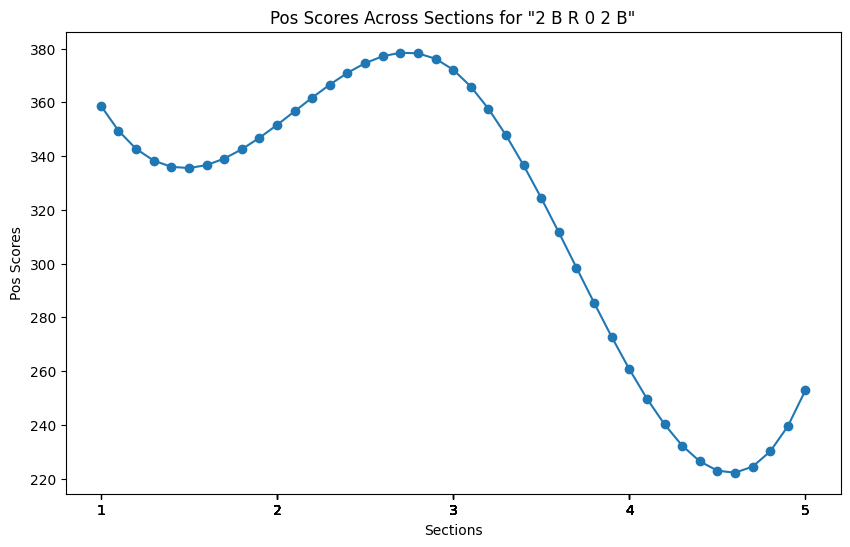

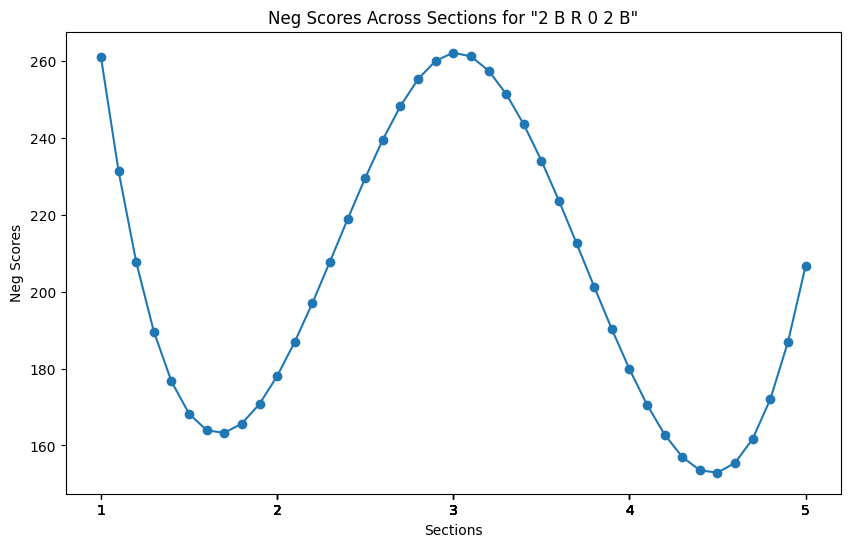

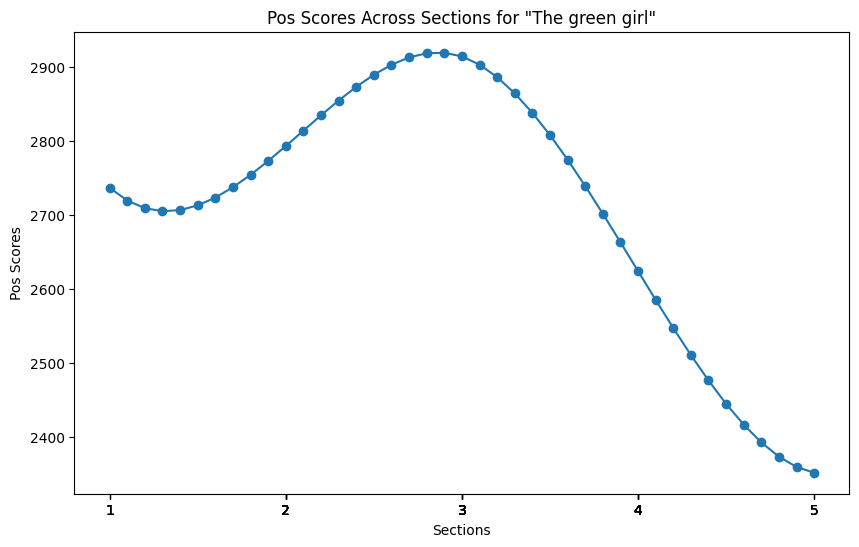

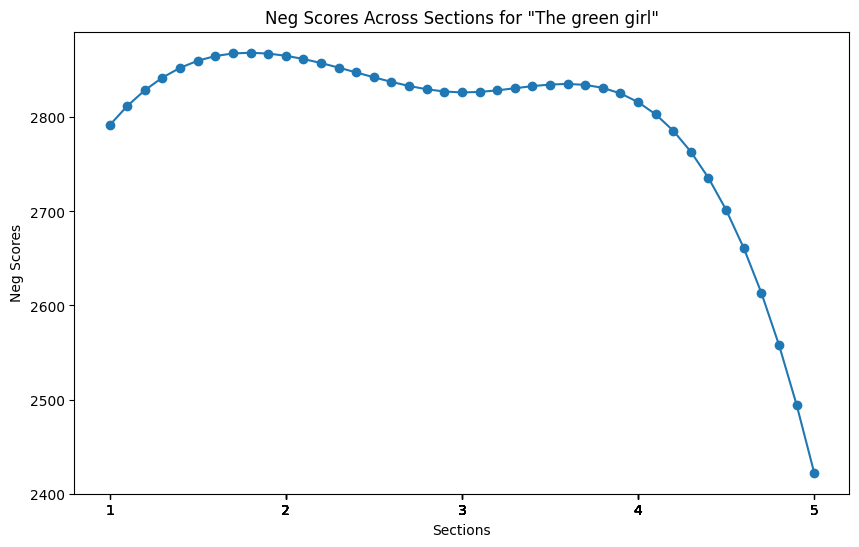

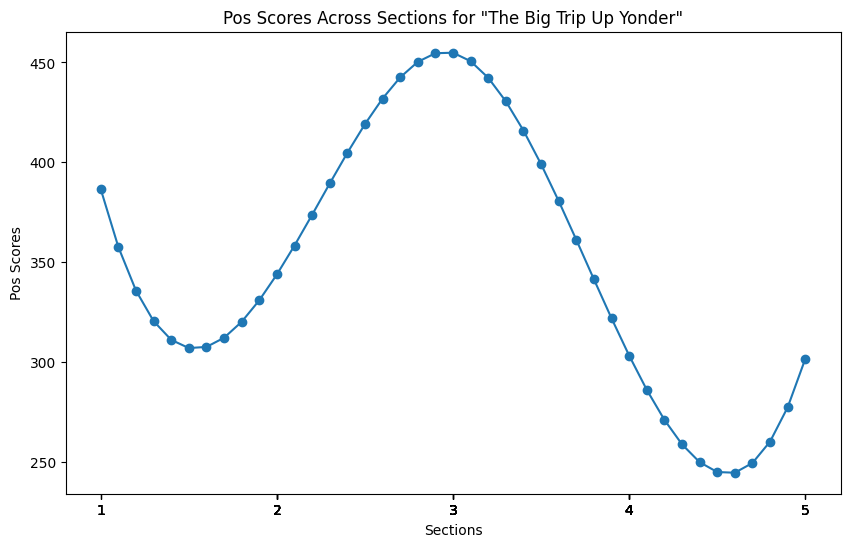

...

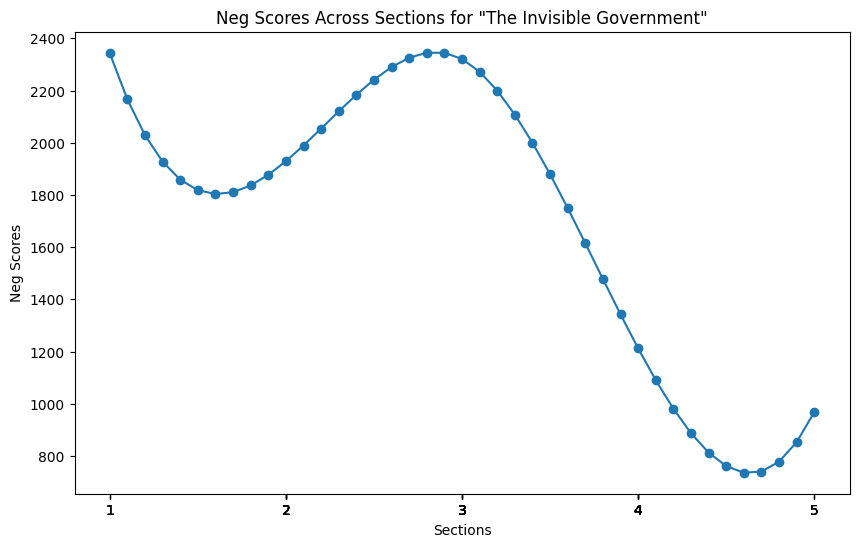

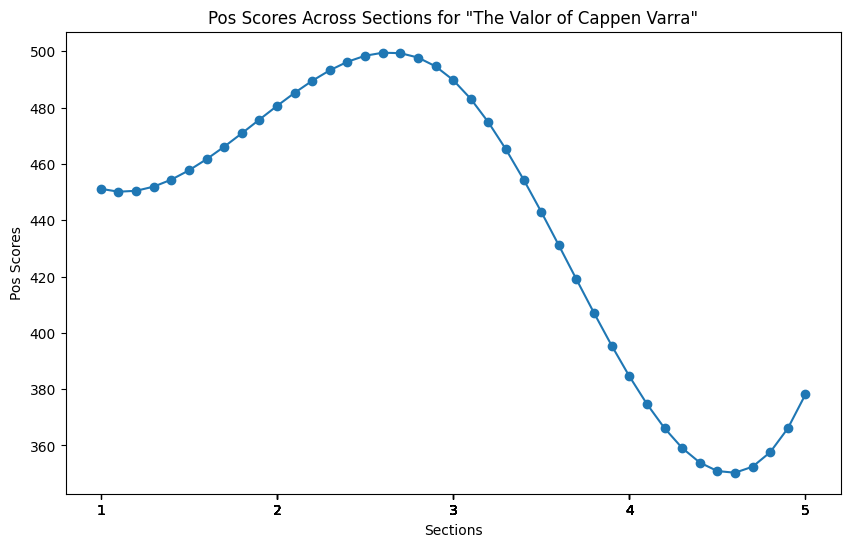

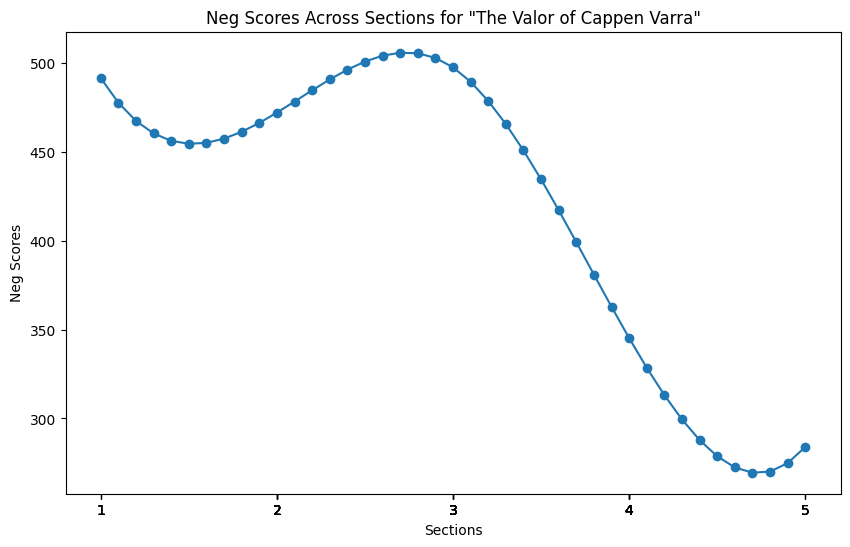

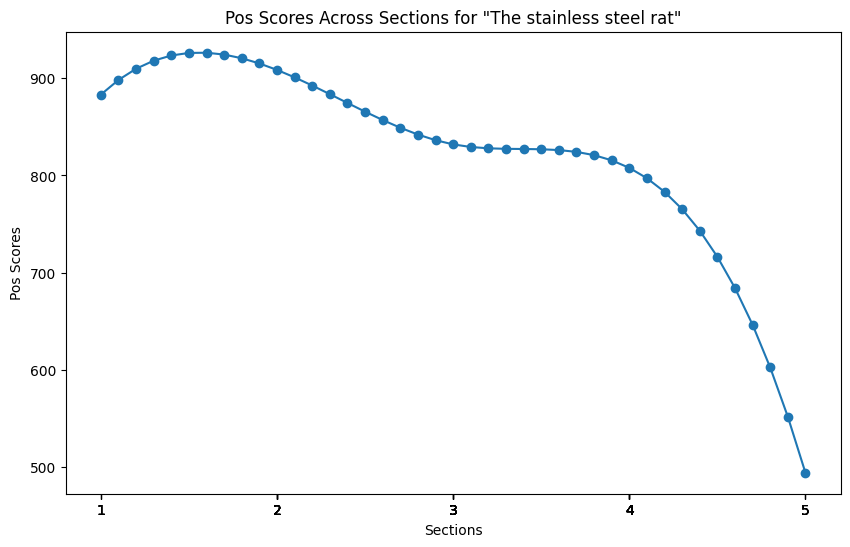

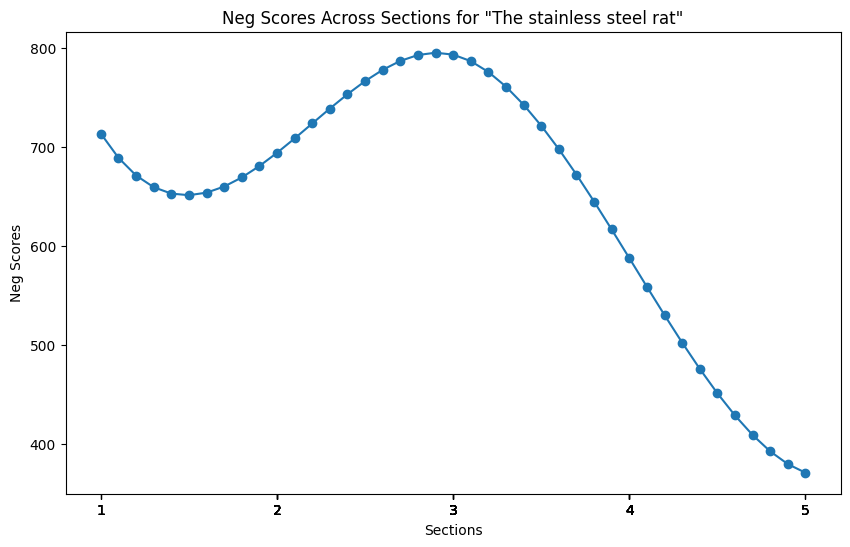

In [ ]:
import nltk
import requests
from nltk.corpus import wordnet as wn
from nltk.corpus import sentiwordnet as swn
import matplotlib.pyplot as plt
from urllib3.util.retry import Retry
from requests.adapters import HTTPAdapter
from scipy.interpolate import interp1d

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('sentiwordnet')

# Session-based requests with retry strategy
GUTENDEX_API_BASE_URL = 'https://gutendex.com'
author_year_start = 2000
author_year_end = 2023
gutendex_url = f'{GUTENDEX_API_BASE_URL}/books?author_year_start={author_year_start}&author_year_end={author_year_end}'
retry_strategy = Retry(total=5, backoff_factor=2, status_forcelist=[429, 500, 502, 503, 504])
adapter = HTTPAdapter(max_retries=retry_strategy)
http = requests.Session()
http.mount("https://", adapter)
http.mount("http://", adapter)

# Fetch book data from Gutendex API
response = http.get(gutendex_url)
if response.status_code == 200:
    gutendex_books = response.json().get('results', [])
else:
    print(f"Failed to fetch data from Gutendex: {response.status_code}")
    gutendex_books = []

book_info = [
    {'title': book.get('title', 'Unknown Title'), 'url': book.get('formats', {}).get('text/plain', '')}
    for book in gutendex_books# Limit to first 4 books for this example
]

emotions = ['pos', 'neg']

def get_emotion_scores(word):
    synsets = wn.synsets(word)
    emotion_scores = {emo: 0 for emo in emotions}

    for synset in synsets:
        senti_synset = swn.senti_synset(synset.name())
        for emo in emotions:
            emotion_scores[emo] += getattr(senti_synset, emo+'_score')()

    return emotion_scores

# Emotional analysis for each book
for book_info_item in book_info:
    book_title = book_info_item['title']
    text_url = book_info_item['url']

    if text_url:
        text_response = http.get(text_url)
        if text_response.status_code == 200:
            text = text_response.text
            words = nltk.word_tokenize(text.lower())
            num_words = len(words)
            section_size = num_words // 5
            sections = [words[i:i+section_size] for i in range(0, num_words, section_size)]

            section_emotion_scores = []
            for section in sections:
                section_scores = {emo: 0 for emo in emotions}
                for word in section:
                    emotion_scores = get_emotion_scores(word)
                    for emo in emotions:
                        section_scores[emo] += emotion_scores[emo]
                section_emotion_scores.append(section_scores)

            for emo in emotions:
                
                scores = [section_score[emo] for section_score in section_emotion_scores[:5]]
                
                # Interpolation for smoother curves
                x = np.linspace(1, 5, num=5, endpoint=True)
                y = scores
                f2 = interp1d(x, y, kind='cubic')

                xnew = np.linspace(1, 5, num=41, endpoint=True)

                plt.figure(figsize=(10, 6))
                plt.plot(xnew, f2(xnew), marker='o')  # Using interpolated values for y
                plt.xlabel('Sections')
                plt.ylabel(f'{emo.capitalize()} Scores')
                plt.title(f'{emo.capitalize()} Scores Across Sections for "{book_title}"')
                plt.xticks(np.round(xnew))
                plt.show()